<a href="https://colab.research.google.com/github/hrumst/ML/blob/NS-gclb-2/gclb2-2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%config IPComplater.greedy = True

In [2]:
from google.colab import drive
drive.mount('./DRIVE', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at ./DRIVE


In [0]:
!rm -rf sample_data

In [0]:
!rm -rf inputs/plates

In [5]:
import shutil, os
shutil.copytree('./DRIVE/My Drive/Colab Notebooks/input/plates', 'inputs/plates')

'inputs/plates'

In [0]:
import cv2
def crop_image(img_path, dest_path):
    path, file = os.path.split(img_path)
    if not file.endswith('.jpg'):
        return
    
    img = cv2.imread(img_path)
    img_m = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_m = cv2.medianBlur(img_m, 5)

    circles = None
    dp = .1
    while dp < 10:
        circles = cv2.HoughCircles(img_m, cv2.HOUGH_GRADIENT, dp, 50)
        dp += .1
        if circles is not None and len(circles) >=3:
            break
    if circles is None:
        cv2.imwrite(dest_path, img)
        return 
      
    img_center = (round(img.shape[0]/2), round(img.shape[1]/2))
    img_center_tol = (round(img_center[0]/3), round(img_center[1]/3))
    img_med_size = round((img.shape[0] + img.shape[1])/6)
    circle_candidates = []
    for circle in circles[0]:
        if abs(circle[0] - img_center[0]) > img_center_tol[0] or abs(circle[1] - img_center[1]) > img_center_tol[1]:
            continue
        if circle[2] < img_med_size:
            continue
        circle_candidates.append(circle)
    
    if len(circle_candidates) > 2:
        max_circle = circle_candidates[0]
        for circle in circle_candidates[1:]:
            if circle[2] > max_circle[2]:
                max_circle = circle
        main_circle = max_circle
    elif len(circle_candidates) == 1:
        main_circle = circle_candidates[0]
    else:
        main_circle =  circles[0][0]

    if main_circle[0] + main_circle[2] > img.shape[0] or main_circle[1] + main_circle[2] > img.shape[1]:
        cv2.imwrite(dest_path, img)
        return 
    main_circle = np.uint16(np.around(main_circle))
    
    mask = np.zeros((img.shape[0],img.shape[1],3), np.uint8)
    cv2.circle(mask,(main_circle[0], main_circle[1]),main_circle[2],(1,1,1),-1,8,0)
    out = np.uint16(img)*np.uint16(mask)
    crop_center = main_circle[2] if main_circle[2] >= 112 else 112
    out = out[
          abs(np.int8(main_circle[1])-np.int8(crop_center)):main_circle[1]+crop_center, 
          abs(np.int8(main_circle[0])-np.int8(crop_center)):main_circle[0]+crop_center,
    ]
    
    cv2.imwrite(dest_path, out)

In [0]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import copy

import torch, torch.nn
from torch import nn
from torchvision import transforms, models
import torchvision

In [8]:
!rm -rf val && rm -rf train

data_root = 'inputs/plates/plates/'
#%%

import shutil 
from tqdm import tqdm

train_dir = 'train'
val_dir = 'val' # validation

class_names = ['cleaned', 'dirty']

# удобное копирование картинок по папкам
for dir_name in [train_dir, val_dir]:
    for class_name in class_names:
        os.makedirs(os.path.join(dir_name, class_name), exist_ok=True)

val_examples = 0
for class_name in class_names:
    source_dir = os.path.join(data_root, 'train', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        # if i % 100 != 0:
        dest_dir = os.path.join(train_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))
        # else:
            # val_examples += 1
            # dest_dir = os.path.join(val_dir, class_name)
            # shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

for class_name in class_names:
    source_dir = os.path.join(data_root, 'ext-test', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        val_examples += 1
        dest_dir = os.path.join(val_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

100%|██████████| 25/25 [00:00<00:00, 2476.44it/s]


In [0]:
import PIL.Image
import random
batch_size = 8

def color_shuffler(pic: PIL.Image):
    arr_pic = np.array(pic)
    sl = [arr_pic[:,:, 0], arr_pic[:,:, 1], arr_pic[:,:, 2]]
    rl = [0,1,2]
    random.shuffle(rl)
    for (i, ri) in enumerate(rl):
        arr_pic[:,:, i] = sl[ri]
    im = PIL.Image.fromarray(arr_pic.astype(np.uint8))
    return im

def color_rand(pic: PIL.Image):
    arr_pic = np.array(pic)
    rl = random.randint(0,2)
    arr_pic[:,:,rl] = arr_pic[:,:,rl] + random.randint(-50,50)
    im = PIL.Image.fromarray(arr_pic.astype(np.uint8))
    return im

train_transforms = transforms.Compose([
    # аугментация
    torchvision.transforms.RandomApply([torchvision.transforms.Lambda(color_shuffler)], p=.5),
    # transforms.RandomApply([torchvision.transforms.Lambda(color_rand),]),
    # transforms.RandomApply([transforms.RandomPerspective(),]),
    transforms.RandomRotation(30),
    transforms.CenterCrop(224),
    transforms.ColorJitter(),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    # нормализация викторов картинок под рез-нет
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    # нормализация викторов картинок под рез-нет
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = torchvision.datasets.ImageFolder(train_dir, train_transforms)
val_dataset = torchvision.datasets.ImageFolder(val_dir, val_transforms)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


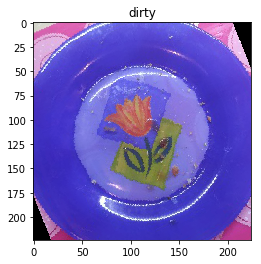

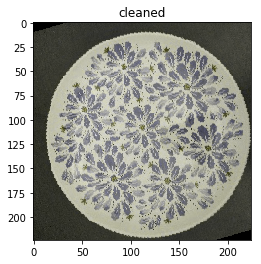

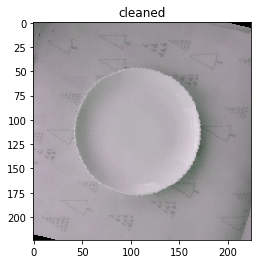

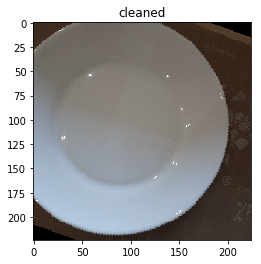

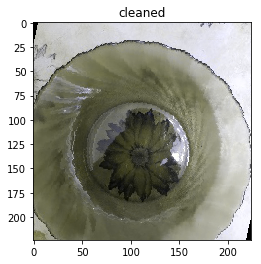

...

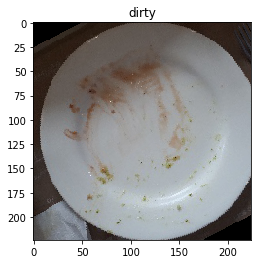

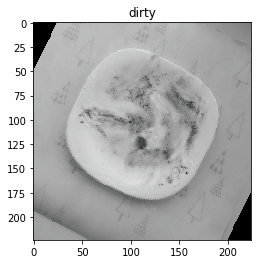

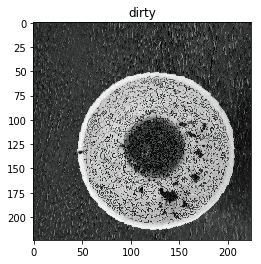

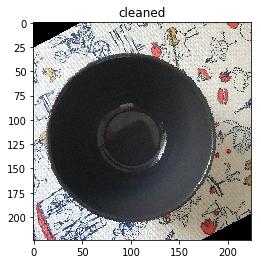

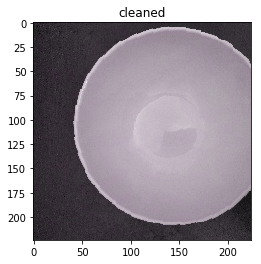

In [38]:
#%%

batch_size = 20
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)
len(train_dataloader), len(train_dataloader)

X_batch, y_batch = next(iter(train_dataloader))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
# денормализация векторов для печати
plt.imshow(X_batch[0].permute(1, 2, 0).numpy() * std + mean);

#%%

def show_input(input_tensor, title=''):
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)

X_batch, y_batch = next(iter(train_dataloader))

for x_item, y_item in zip(X_batch, y_batch):
    show_input(x_item, title=class_names[y_item])

In [0]:
def make_resnext101_32x8d():
    model = models.resnext101_32x8d(pretrained=True)
    model.fc = nn.Sequential(
        nn.BatchNorm1d(model.fc.in_features),
        nn.Linear(model.fc.in_features, 100),
        nn.BatchNorm1d(100),
        nn.ELU(),
        nn.Linear(100, 2)
    )

    passed, muted = {}, {}
    for name, child in model.named_children():
        if name in ['layer4', 'avgpool', 'fc']:
            if name not in passed:
                passed[name] = 0
            for (i,param) in enumerate(child.parameters()):
                passed[name] += 1
        else:
            if name not in muted:
                muted[name] = 0
            for (i,param) in enumerate(child.parameters()):
                param.requires_grad = False         
                muted[name] += 1
    
    sum_muted, sum_passed = 0, 0
    for k, v in muted.items():
        sum_muted += v
    for k, v in passed.items():
        sum_passed += v
    
    print(muted, passed)
    print('total muted:', sum_muted, 'total passed:', sum_passed)
    return model

def unfreeze_layer(model, layer, params):
    un_freezed = 0
    for name, child in model.named_children():
        if name != layer:
            continue
        for chName, chChild in child.named_children():
            if int(chName) not in params:
                continue
            for (i,param) in enumerate(chChild.parameters()):
                param.requires_grad = True         
                un_freezed += 1
    print('\nUnfreezed for layer#{}: {}'.format(layer, un_freezed))

def resnet101_32x8d_unfreeze_3l(model, epoch_num):
    if epoch_num == 75:
        unfreeze_layer(model, 'layer3', [20, 21, 22])
    elif epoch_num == 125:
        unfreeze_layer(model, 'layer3', [18,19])

In [0]:
# pretrained=True сеть уже пред-тренерована на гугловом имадже-нете
def make_resnet152():
    model = models.resnet152(pretrained=True)
    model.fc = nn.Sequential(
        nn.BatchNorm1d(model.fc.in_features),
        nn.Linear(model.fc.in_features, 100),
        nn.BatchNorm1d(100),
        nn.ELU(),
        nn.Linear(100, 2)
    )
    
    passed, muted = {}, {}
    for name, child in model.named_children():
        if name in ['layer4', 'avgpool', 'fc']:
            if name not in passed:
                passed[name] = 0
            for (i,param) in enumerate(child.parameters()):
                passed[name] += 1
                
        elif name == 'layer3':
            for chName, chChild in child.named_children():
                if name not in muted:
                    muted[name] = 0
                if int(chName) not in [32, 33, 34, 35]:
                    for (i,param) in enumerate(chChild.parameters()):
                        param.requires_grad = False         
                        muted[name] += 1
                else:
                    if name not in passed:
                        passed[name] = 0
                    for (i,param) in enumerate(chChild.parameters()):       
                        passed[name] += 1
        else:
            if name not in muted:
                muted[name] = 0
            for (i,param) in enumerate(child.parameters()):
                param.requires_grad = False         
                muted[name] += 1
    
    sum_muted, sum_passed = 0, 0
    for k, v in muted.items():
        sum_muted += v
    for k, v in passed.items():
        sum_passed += v
    
    print(muted, passed)
    print('total muted:', sum_muted, 'total passed:', sum_passed)
    return model

In [0]:
t1 = torch.tensor([1,2,3,4])
t2 = torch.tensor([1,2,5,4])
for (i, el) in enumerate(t1):
    print(el, t2[i])

cmp = (t1 == t2)
for (i, el) in enumerate(cmp):
    if el == 1:
        print(el)

print(cmp.float().mean())

tensor(1) tensor(1)
tensor(2) tensor(2)
tensor(3) tensor(5)
tensor(4) tensor(4)
tensor(1, dtype=torch.uint8)
tensor(1, dtype=torch.uint8)
tensor(1, dtype=torch.uint8)
tensor(0.7500)


In [0]:
class EpochModel():
    def __init__(self, train_dataloader, val_dataloader, model, loss, optimizer, scheduler, device, unfreeze_func=None):
        self.train_dataloader = train_dataloader
        self.val_dataloader = val_dataloader
        self.model = model
        self.loss = loss
        self.optimizer = optimizer
        self.scheduler = scheduler
        self.unfreeze_func = unfreeze_func
        
        self.device = device
        
        self.train_ac_history = []
        self.val_ac_history = []

        self.fail_cmp_stats = {}
        for i in range(0, val_examples):
             self.fail_cmp_stats[i] = 0
        
    def train(self, num_epochs, train_phases=None):
        if train_phases is None:
            train_phases = [self._epoch_train, self._epoch_validate]
        for epoch in range(num_epochs):
            print('Epoch {}/{}:'.format(epoch, num_epochs - 1), flush=True)
            self.unfreeze_func(self.model, epoch)
            for phase in train_phases:
                phase()
        return model

    def _print_log(self, phase, epoch_loss, epoch_acc):
        print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc), flush=True)
    
    def _epoch_validate(self):
        self.model.eval()

        running_loss = 0.
        running_acc = 0.
        running_acc_m = 0.

        i_acc = 0
        for inputs, labels in tqdm(self.val_dataloader):
            inputs = inputs.to(self.device)
            labels = labels.to(self.device)

            self.optimizer.zero_grad()
            with torch.set_grad_enabled(False):
                preds = self.model(inputs)
                loss_value = self.loss(preds, labels)
                preds_class = preds.argmax(dim=1)

            running_loss += loss_value.item()
            running_acc = (preds_class == labels.data)
            running_acc_m += running_acc.float().mean()

            for run_acc_item in running_acc:
                if run_acc_item == 0:
                    self.fail_cmp_stats[i_acc] += 1
                i_acc += 1
        
        epoch_loss = running_loss / len(self.val_dataloader)
        epoch_acc = running_acc_m / len(self.val_dataloader)
        self._print_log('validate', epoch_loss, epoch_acc)
        self.val_ac_history.append(epoch_acc.item())

    def _epoch_train(self):
        self.model.train()

        running_loss = 0.
        running_acc = 0.

        for inputs, labels in tqdm(self.train_dataloader):
            inputs = inputs.to(self.device)
            labels = labels.to(self.device)

            self.optimizer.zero_grad()
            with torch.set_grad_enabled(True):
                preds = self.model(inputs)
                loss_value = self.loss(preds, labels)
                preds_class = preds.argmax(dim=1)
                # train work
                loss_value.backward()
                self.optimizer.step()

            running_loss += loss_value.item()
            running_acc += (preds_class == labels.data).float().mean()

        epoch_loss = running_loss / len(self.train_dataloader)
        epoch_acc = running_acc / len(self.train_dataloader)

        # train work
        self.scheduler.step(epoch_loss)

        self._print_log('train', epoch_loss, epoch_acc)
        self.train_ac_history.append(epoch_acc.item())

In [0]:
batch_size = 8

train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)
len(train_dataloader), len(train_dataloader)
            

tme_history = []
for i in [9]:
    torch.backends.cudnn.deterministic = True
    torch.cuda.manual_seed(i)
    np.random.seed(i)
    torch.manual_seed(i)

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = make_resnext101_32x8d().to(device)

    for _ in [1]:
        loss = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adamax(model.parameters(), lr=.005)

        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, verbose=True)

        tme = EpochModel(train_dataloader, val_dataloader, model, loss, optimizer, scheduler, device, resnet101_32x8d_unfreeze_3l)
        tme_history.append(tme)
        tme.train(200)

{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:


100%|██████████| 5/5 [00:02<00:00,  1.75it/s]

train Loss: 1.1551 Acc: 0.4750



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 1598.2362 Acc: 0.5833
Epoch 1/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.6002 Acc: 0.6750



100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

validate Loss: 18.3722 Acc: 0.5833
Epoch 2/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.5435 Acc: 0.7500



100%|██████████| 6/6 [00:02<00:00,  2.79it/s]

validate Loss: 0.6035 Acc: 0.7875
Epoch 3/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.4067 Acc: 0.9500



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.5307 Acc: 0.7875
Epoch 4/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.3367 Acc: 0.9500



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.4702 Acc: 0.8500
Epoch 5/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.2344 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.4244 Acc: 0.8292
Epoch 6/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.2221 Acc: 0.9500



100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

validate Loss: 0.3773 Acc: 0.8208
Epoch 7/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.2230 Acc: 0.9250



100%|██████████| 6/6 [00:02<00:00,  2.88it/s]

validate Loss: 0.4331 Acc: 0.7500
Epoch 8/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.2682 Acc: 0.8750



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.5873 Acc: 0.6875
Epoch 9/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.2477 Acc: 0.9250



100%|██████████| 6/6 [00:02<00:00,  2.86it/s]

validate Loss: 0.5011 Acc: 0.7083
Epoch 10/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.0669 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.4584 Acc: 0.7500
Epoch 11/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.1440 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.81it/s]

validate Loss: 0.4963 Acc: 0.7083
Epoch 12/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0732 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.5046 Acc: 0.7292
Epoch 13/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.1314 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.3798 Acc: 0.7500
Epoch 14/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0796 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.3927 Acc: 0.7708
Epoch 15/199:



100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

train Loss: 0.2247 Acc: 0.9500



100%|██████████| 6/6 [00:02<00:00,  2.84it/s]

validate Loss: 0.4114 Acc: 0.7708
Epoch 16/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.1882 Acc: 0.9500



100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

validate Loss: 0.4298 Acc: 0.7500
Epoch 17/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0730 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.78it/s]

validate Loss: 0.4101 Acc: 0.7708
Epoch 18/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.2000 Acc: 0.9500



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.3946 Acc: 0.7917
Epoch 19/199:



100%|██████████| 5/5 [00:02<00:00,  2.01it/s]

train Loss: 0.0550 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  3.01it/s]

validate Loss: 0.3867 Acc: 0.7917
Epoch 20/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0431 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.3578 Acc: 0.7917
Epoch 21/199:



100%|██████████| 5/5 [00:02<00:00,  1.98it/s]

train Loss: 0.0505 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.80it/s]

validate Loss: 0.3334 Acc: 0.7917
Epoch 22/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0218 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.79it/s]

validate Loss: 0.3374 Acc: 0.7708
Epoch 23/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0844 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.3008 Acc: 0.8125
Epoch 24/199:



100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

train Loss: 0.0314 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.2603 Acc: 0.8958
Epoch 25/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0304 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.2457 Acc: 0.9167
Epoch 26/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0421 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

validate Loss: 0.2501 Acc: 0.9167
Epoch 27/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0527 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

validate Loss: 0.2472 Acc: 0.9167
Epoch 28/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0305 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.97it/s]

validate Loss: 0.2803 Acc: 0.8542
Epoch 29/199:



100%|██████████| 5/5 [00:02<00:00,  1.92it/s]

train Loss: 0.0332 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.2907 Acc: 0.8542
Epoch 30/199:



100%|██████████| 5/5 [00:02<00:00,  2.08it/s]

train Loss: 0.0189 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

validate Loss: 0.3147 Acc: 0.8542
Epoch 31/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0146 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.3353 Acc: 0.8125
Epoch 32/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0152 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.78it/s]

validate Loss: 0.3562 Acc: 0.8333
Epoch 33/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0226 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.3445 Acc: 0.8333
Epoch 34/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0669 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

validate Loss: 0.2644 Acc: 0.8542
Epoch 35/199:



100%|██████████| 5/5 [00:02<00:00,  1.92it/s]

train Loss: 0.0269 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.78it/s]

validate Loss: 0.2473 Acc: 0.8750
Epoch 36/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.0075 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

validate Loss: 0.2430 Acc: 0.8833
Epoch 37/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.0303 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.2366 Acc: 0.9042
Epoch 38/199:



100%|██████████| 5/5 [00:02<00:00,  1.98it/s]

train Loss: 0.0295 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

validate Loss: 0.2270 Acc: 0.9375
Epoch 39/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0300 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

validate Loss: 0.2353 Acc: 0.8750
Epoch 40/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.1496 Acc: 0.9500



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.2532 Acc: 0.8958
Epoch 41/199:



100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

train Loss: 0.0315 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.89it/s]

validate Loss: 0.2903 Acc: 0.8750
Epoch 42/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0858 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.85it/s]

validate Loss: 0.3107 Acc: 0.8750
Epoch 43/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.0675 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.2717 Acc: 0.8750
Epoch 44/199:



100%|██████████| 5/5 [00:02<00:00,  1.92it/s]

train Loss: 0.0102 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.2573 Acc: 0.8750
Epoch 45/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0161 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.2322 Acc: 0.8750
Epoch 46/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.2409 Acc: 0.9500



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.2621 Acc: 0.8750
Epoch 47/199:



100%|██████████| 5/5 [00:02<00:00,  2.04it/s]

Epoch    47: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.1414 Acc: 0.9500



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.3601 Acc: 0.7917
Epoch 48/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.0130 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.4092 Acc: 0.7708
Epoch 49/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.0355 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.4575 Acc: 0.7500
Epoch 50/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0194 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

validate Loss: 0.4755 Acc: 0.7292
Epoch 51/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0380 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.4919 Acc: 0.7292
Epoch 52/199:



100%|██████████| 5/5 [00:02<00:00,  2.00it/s]

train Loss: 0.0275 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.82it/s]

validate Loss: 0.4795 Acc: 0.7292
Epoch 53/199:



100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

train Loss: 0.0167 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.4821 Acc: 0.7500
Epoch 54/199:



100%|██████████| 5/5 [00:02<00:00,  2.00it/s]

train Loss: 0.0121 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.4911 Acc: 0.7500
Epoch 55/199:



100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

train Loss: 0.0192 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.78it/s]

validate Loss: 0.4831 Acc: 0.7500
Epoch 56/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0085 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.4618 Acc: 0.7500
Epoch 57/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0105 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.4759 Acc: 0.7292
Epoch 58/199:



100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

Epoch    58: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0130 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.4617 Acc: 0.7500
Epoch 59/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0362 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

validate Loss: 0.4555 Acc: 0.7500
Epoch 60/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0658 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.4151 Acc: 0.8125
Epoch 61/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0248 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.78it/s]

validate Loss: 0.4307 Acc: 0.7917
Epoch 62/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0167 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

validate Loss: 0.4183 Acc: 0.7917
Epoch 63/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0098 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

validate Loss: 0.4477 Acc: 0.7500
Epoch 64/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.0557 Acc: 0.9750



100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

validate Loss: 0.4227 Acc: 0.7917
Epoch 65/199:



100%|██████████| 5/5 [00:02<00:00,  2.01it/s]

train Loss: 0.0194 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.4097 Acc: 0.7917
Epoch 66/199:



100%|██████████| 5/5 [00:02<00:00,  1.93it/s]

train Loss: 0.0116 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.76it/s]

validate Loss: 0.4176 Acc: 0.7917
Epoch 67/199:



100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

train Loss: 0.0324 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.93it/s]

validate Loss: 0.4012 Acc: 0.7917
Epoch 68/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0319 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

validate Loss: 0.3924 Acc: 0.8333
Epoch 69/199:



100%|██████████| 5/5 [00:02<00:00,  2.00it/s]

Epoch    69: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0158 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.81it/s]

validate Loss: 0.3923 Acc: 0.8333
Epoch 70/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0186 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.81it/s]

validate Loss: 0.4315 Acc: 0.7708
Epoch 71/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0075 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.77it/s]

validate Loss: 0.4239 Acc: 0.7917
Epoch 72/199:



100%|██████████| 5/5 [00:02<00:00,  1.94it/s]

train Loss: 0.0179 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.4387 Acc: 0.7708
Epoch 73/199:



100%|██████████| 5/5 [00:02<00:00,  1.97it/s]

train Loss: 0.0118 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

validate Loss: 0.4384 Acc: 0.7500
Epoch 74/199:



100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

train Loss: 0.0153 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.4428 Acc: 0.7708
Epoch 75/199:



  0%|          | 0/5 [00:00<?, ?it/s]


Unfreezed for layer#layer3: 27


100%|██████████| 5/5 [00:02<00:00,  1.76it/s]

train Loss: 0.0400 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.69it/s]

validate Loss: 0.4473 Acc: 0.7708
Epoch 76/199:



100%|██████████| 5/5 [00:02<00:00,  1.74it/s]

train Loss: 0.0277 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.74it/s]

validate Loss: 0.4239 Acc: 0.7917
Epoch 77/199:



100%|██████████| 5/5 [00:02<00:00,  1.80it/s]

train Loss: 0.0118 Acc: 1.0000



100%|██████████| 6/6 [00:02<00:00,  2.78it/s]

validate Loss: 0.4262 Acc: 0.7708
Epoch 78/199:



100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

train Loss: 0.0470 Acc: 0.9750



 17%|█▋        | 1/6 [00:00<00:04,  1.07it/s]

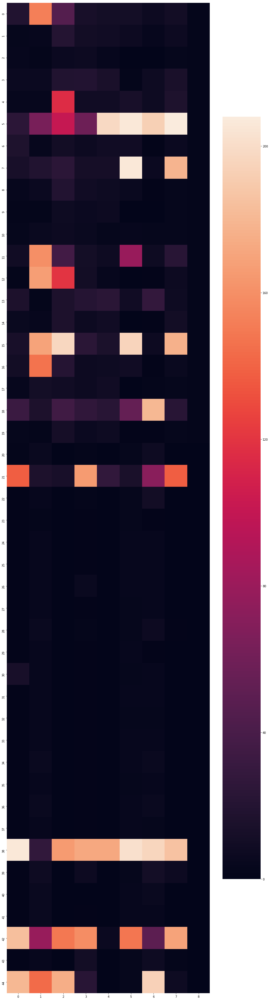

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

model_fail_cnts = []
for i in range(0, 45):
    fail_cnts = []
    for model in tme_history:
        fail_cnts.append(model.fail_cmp_stats[i])
    model_fail_cnts.append(fail_cnts)

plt.figure(figsize=(16, 64))
sns.heatmap(model_fail_cnts)

44 0.88549603110268


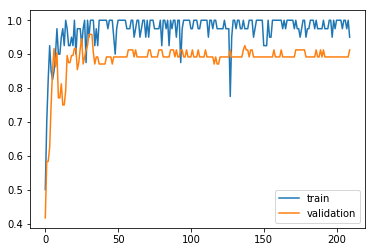

44 0.8569444778419676


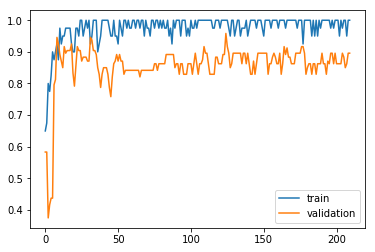

44 0.8478770009108952


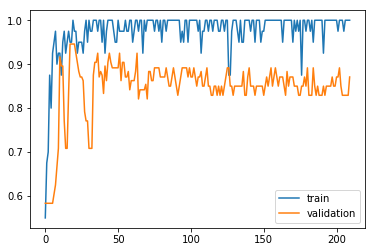

44 0.9059325923522313


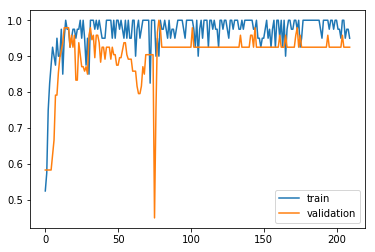

44 0.9406151135762533


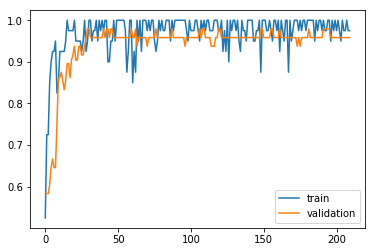

44 0.8662500477972485


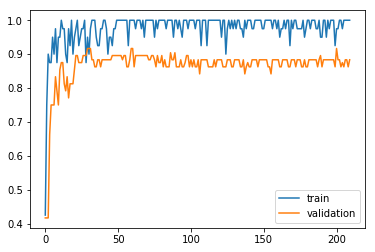

44 0.8778174895615805


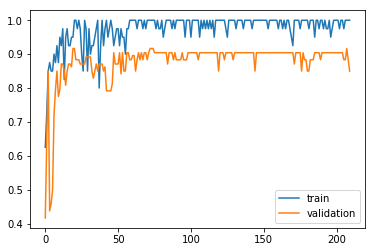

In [22]:
for th in tme_history:
    print(i, np.mean(th.val_ac_history))
    plt.plot(th.train_ac_history, label='train')
    plt.plot(th.val_ac_history, label='validation')
    plt.legend()
    plt.show()
    plt.pause(.001)

In [0]:
tme_history = tme_history[:7]

In [0]:
top_model = tme_history[0]
if len(tme_history) > 1:
    for tm in tme_history[1:]:
        if np.mean(tm.val_ac_history) > np.mean(top_model.val_ac_history):
            top_model = tm
model = top_model.model
    

100%|██████████| 15/15 [02:26<00:00,  9.37s/it]


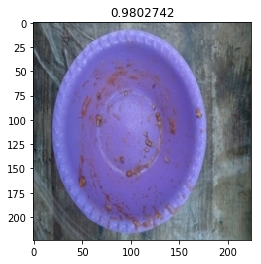

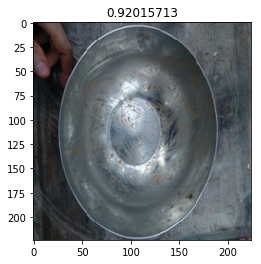

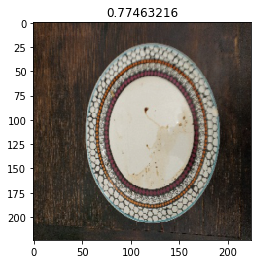

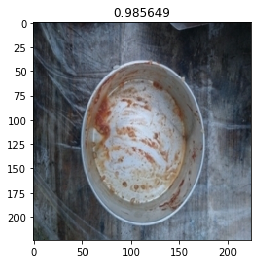

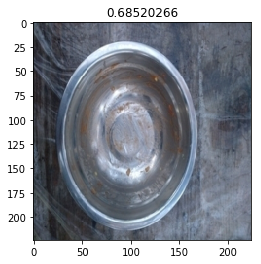

...

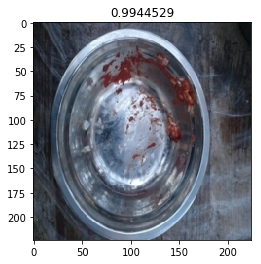

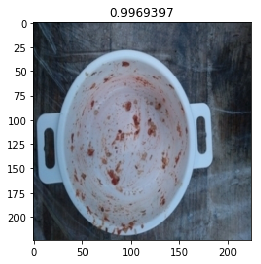

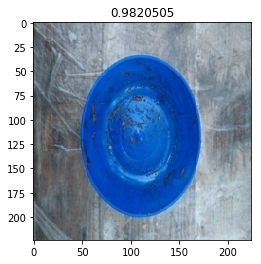

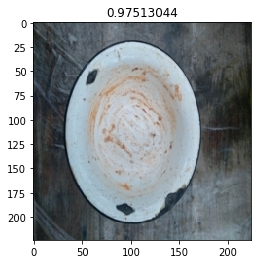

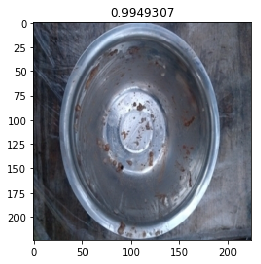

In [24]:
!rm -rf test
!rm submission.csv

test_dir = 'test'
shutil.copytree(os.path.join(data_root, 'test'), os.path.join(test_dir, 'unknown'))

class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path

test_dataset = ImageFolderWithPaths(test_dir, val_transforms)
test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=50, shuffle=False, num_workers=batch_size)

for tm in tme_history:
    tm.model.eval()

test_predictions = []
test_img_paths = []

for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        pr_preds = []
        for tm in tme_history:
            preds = tm.model(inputs)
            pr_preds.append(torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
        pp_result = pr_preds[0]
        for pp in pr_preds[1:]:
            pp_result += pp
        test_predictions.append(pp_result / len(tme_history))
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)

submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

submission_df.to_csv('submission.csv')

            

rm: cannot remove 'submission.csv': No such file or directory


100%|██████████| 15/15 [00:22<00:00,  1.37s/it]


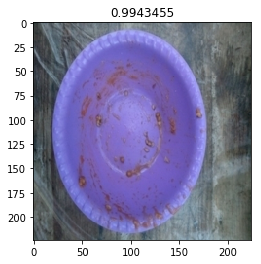

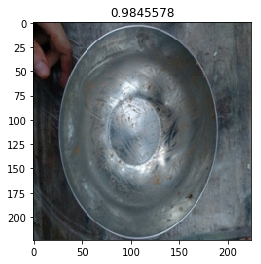

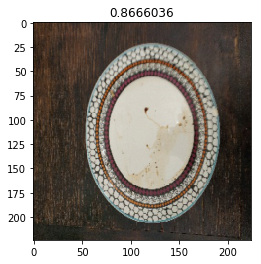

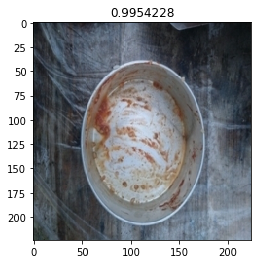

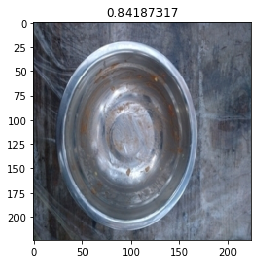

...

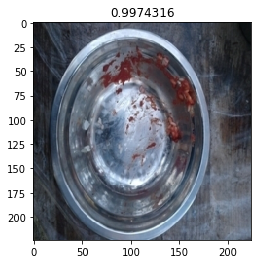

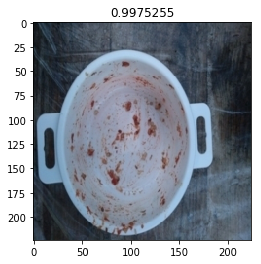

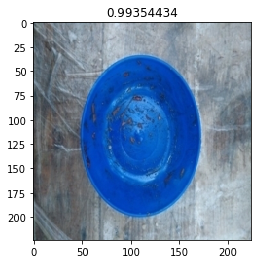

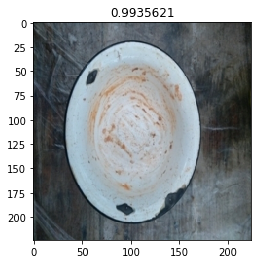

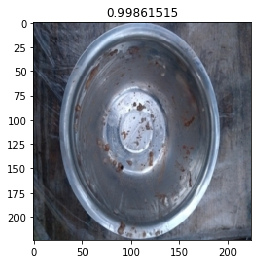

In [23]:
#%%

!rm -rf test
!rm submission.csv

test_dir = 'test'
shutil.copytree(os.path.join(data_root, 'test'), os.path.join(test_dir, 'unknown'))
model = tme_history[4].model

class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
    
test_dataset = ImageFolderWithPaths(test_dir, val_transforms)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=50, shuffle=False, num_workers=batch_size)

model.eval()

test_predictions = []
test_img_paths = []
for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(
        torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)
    
submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

submission_df.to_csv('submission.csv')

In [0]:
!ls -la

total 48
drwxr-xr-x 1 root root 4096 Jul 28 21:47 .
drwxr-xr-x 1 root root 4096 Jul 28 20:18 ..
drwxr-xr-x 1 root root 4096 Jul 19 16:14 .config
drwx------ 3 root root 4096 Jul 28 20:57 DRIVE
drwxr-xr-x 3 root root 4096 Jul 28 20:57 inputs
drwxr-xr-x 1 root root 4096 Jul 19 16:14 sample_data
-rw-r--r-- 1 root root 8653 Jul 28 21:47 submission.csv
drwxr-xr-x 3 root root 4096 Jul 28 21:47 test
drwxr-xr-x 4 root root 4096 Jul 28 21:01 train
drwxr-xr-x 4 root root 4096 Jul 28 21:01 val
